In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.linear_model import LinearRegression, Lasso, LassoCV
from sklearn.preprocessing import StandardScaler
import statsmodels.api as sm
from sklearn.model_selection import train_test_split, KFold
from sklearn.metrics import mean_absolute_error, r2_score, mean_squared_error
from scipy.stats import levene
from scipy.stats import ttest_ind

**Note:** I primarily use DataSpell which has SQL cells in addition to the standard Code and Markdown cells.
This allows for the interactive selection of a data source and assignment of variable names resulting from the query,
which aren't visible outside of DataSpel (they essentially use the magic command `%%sql`).

# Exploration

In [2]:
%%sql
SELECT *
FROM per_game_stats_raw

,Rk,Player,Age,Team,Pos,G,GS,MP,FG,FGA,...,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,Awards,Year
0,1.0,George Mikan,25.0,MNL,C,68.0,NaN,NaN,9.5,23.5,...,NaN,NaN,2.9,NaN,NaN,NaN,4.4,27.4,NBA1,1950
1,2.0,Alex Groza,23.0,INO,NaN,64.0,NaN,NaN,8.1,17.0,...,NaN,NaN,2.5,NaN,NaN,NaN,3.5,23.4,"ROY-1,NBA1",1950
2,3.0,Frankie Brian,26.0,AND,NaN,64.0,NaN,NaN,5.8,18.1,...,NaN,NaN,3.0,NaN,NaN,NaN,3.0,17.8,NBA2,1950
3,4.0,Kenny Sailors,29.0,DNN,NaN,57.0,NaN,NaN,5.8,16.6,...,NaN,NaN,4.0,NaN,NaN,NaN,4.2,17.3,NaN,1950
4,5.0,Dolph Schayes,21.0,SYR,NaN,64.0,NaN,NaN,5.4,14.1,...,NaN,NaN,4.0,NaN,NaN,NaN,3.5,16.8,NBA2,1950
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30306,167.0,Dick Shrider,25.0,NYK,NaN,4.0,NaN,NaN,0.0,0.0,...,NaN,NaN,0.5,NaN,NaN,NaN,0.5,0.3,NaN,1949
30307,168.0,Jack Maddox,29.0,INJ,NaN,1.0,NaN,NaN,0.0,0.0,...,NaN,NaN,1.0,NaN,NaN,NaN,0.0,0.0,NaN,1949
30308,169.0,Paul Napolitano,25.0,INJ,NaN,1.0,NaN,NaN,0.0,0.0,...,NaN,NaN,0.0,NaN,NaN,NaN,0.0,0.0,NaN,1949
30309,170.0,Ben Scharnus,31.0,PRO,NaN,1.0,NaN,NaN,0.0,1.0,...,NaN,NaN,0.0,NaN,NaN,NaN,0.0,0.0,NaN,1949


## File Formats and Structure:

The data we'll be working with is stored as a table (named `per_game_stats_raw`) in an SQLite database (named `nba_stats`). We'll utilize a mix of SQL queries and Pandas DataFrame operations, which means we will never explicitly create any CSV, TSV, or JSON files, for example. However, we are still working with tabular data, and since our data is a table in stored using SQL, it confirms that it is also rectangular. Our data is also organized in records and is not nested, so we won't need to do any parsing or un-nesting of the data.

## Variable Types:

We have a lot of data to work with, but let's figure out just how much there is.

In [3]:
# Get the row and column count
rows, columns = data.shape

# Print the counts
print(f"Number of rows: {rows}")
print(f"Number of columns: {columns}")

Number of rows: 30311
Number of columns: 32


In [4]:
# Get column names and dtypes function
def get_names_dtypes(df):
    return pd.DataFrame({
        "Column Name": df.copy().columns,
        "Data Type": df.copy().dtypes
    }).reset_index(drop=True)

df_summary = get_names_dtypes(data)
print(df_summary)

   Column Name Data Type
0           Rk   float64
1       Player    object
2          Age   float64
3         Team    object
4          Pos    object
5            G   float64
6           GS   float64
7           MP   float64
8           FG   float64
9          FGA   float64
10         FG%   float64
11          3P   float64
12         3PA   float64
13         3P%   float64
14          2P   float64
15         2PA   float64
16         2P%   float64
17        eFG%   float64
18          FT   float64
19         FTA   float64
20         FT%   float64
21         ORB   float64
22         DRB   float64
23         TRB   float64
24         AST   float64
25         STL   float64
26         BLK   float64
27         TOV   float64
28          PF   float64
29         PTS   float64
30      Awards    object
31        Year     int64


As seen by the outputs, we're essentially dealing with a $30,000 \times 32$ table, and a mix of data types within the 32 columns. It's interesting that most of the data is stored as a type that isn't the most ideal or efficient choice. We should probably fix that before moving on. All `object` values can be safely converted to `string` dtypes, and some `float64` values can be safely converted to `int64` dtypes.

In [5]:
# Convert columns to new data types
data = data.copy().astype({
    "Rk": "Int64",
    "Age": "Int64",
    "G": "Int64",
    "GS": "Int64",
    "Year": "Int64",
    "Player": "string",
    "Team": "string",
    "Pos": "string",
    "Awards": "string"
})

df_summary = get_names_dtypes(data)
print(df_summary)

   Column Name       Data Type
0           Rk           Int64
1       Player  string[python]
2          Age           Int64
3         Team  string[python]
4          Pos  string[python]
5            G           Int64
6           GS           Int64
7           MP         float64
8           FG         float64
9          FGA         float64
10         FG%         float64
11          3P         float64
12         3PA         float64
13         3P%         float64
14          2P         float64
15         2PA         float64
16         2P%         float64
17        eFG%         float64
18          FT         float64
19         FTA         float64
20         FT%         float64
21         ORB         float64
22         DRB         float64
23         TRB         float64
24         AST         float64
25         STL         float64
26         BLK         float64
27         TOV         float64
28          PF         float64
29         PTS         float64
30      Awards  string[python]
31      

That looks better. Since most of the numeric values are decimals, they should remain `float64`, but some are better stored as `int64`.

Now, we should focus on defining the variable types for all the data.

In [7]:
# Define categories for each variable type
categories = {
    "Qualitative Nominal":     ["Player", "Team", "Pos", "Awards"],
    "Quantitative Discrete":   ["Rk", "Age", "G", "GS", "Year"],
    "Quantitative Continuous": ["MP", "FG", "FGA", "FG%", "3P",
                                "3PA", "3P%", "2P", "2PA", "2P%",
                                "eFG%", "FT", "FTA", "FT%", "ORB",
                                "DRB", "TRB", "AST", "STL", "BLK",
                                "TOV", "PF", "PTS"]
}

variable_types = {}
for var in categories["Qualitative Nominal"]:
    variable_types[var] = "Qualitative Nominal"
for var in categories["Quantitative Discrete"]:
    variable_types[var] = "Quantitative Discrete"
for var in categories["Quantitative Continuous"]:
    variable_types[var] = "Quantitative Continuous"

df_summary = get_names_dtypes(data)

# Add a variable type column and map them
df_summary["Variable Type"] = df_summary["Column Name"].map(variable_types)

df_summary.head()

,Column Name,Data Type,Variable Type
0,Rk,Int64,Quantitative Discrete
1,Player,string[python],Qualitative Nominal
2,Age,Int64,Quantitative Discrete
3,Team,string[python],Qualitative Nominal
4,Pos,string[python],Qualitative Nominal


Now we have a DataFrame named `df_summary` that can be used as a reference in the future.


## Granularity, Scope, and Temporality:

In [517]:
data.head()

,Rk,Player,Age,Team,Pos,G,GS,MP,FG,FGA,...,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,Awards,Year
0,1,George Mikan,25,MNL,C,68,<NA>,NaN,9.5,23.5,...,NaN,NaN,2.9,NaN,NaN,NaN,4.4,27.4,NBA1,1950
1,2,Alex Groza,23,INO,<NA>,64,<NA>,NaN,8.1,17.0,...,NaN,NaN,2.5,NaN,NaN,NaN,3.5,23.4,"ROY-1,NBA1",1950
2,3,Frankie Brian,26,AND,<NA>,64,<NA>,NaN,5.8,18.1,...,NaN,NaN,3.0,NaN,NaN,NaN,3.0,17.8,NBA2,1950
3,4,Kenny Sailors,29,DNN,<NA>,57,<NA>,NaN,5.8,16.6,...,NaN,NaN,4.0,NaN,NaN,NaN,4.2,17.3,<NA>,1950
4,5,Dolph Schayes,21,SYR,<NA>,64,<NA>,NaN,5.4,14.1,...,NaN,NaN,4.0,NaN,NaN,NaN,3.5,16.8,NBA2,1950


In our data, each record represents a player's average, per-game statistics across a particular NBA season—with one nuance. For players who play on multiple teams in a single season, their data is represented differently. These players have separated-by-team statistics (their performance while on each team) and combined statistics (their aggregated performance across the entire season). So, a player that got traded one time mid-season from the Boston Celtics to the Los Angeles Clippers will have three total rows associated with that season, `2TM`, `BOS`, and `LAC`. We will have to address this later on.

In [518]:
league_averages = data.loc[data['Player'] == 'League Average']
league_averages

,Rk,Player,Age,Team,Pos,G,GS,MP,FG,FGA,...,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,Awards,Year
312,<NA>,League Average,<NA>,ALL,<NA>,<NA>,<NA>,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,<NA>,1950
502,<NA>,League Average,<NA>,ALL,<NA>,<NA>,<NA>,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,<NA>,1951
639,<NA>,League Average,<NA>,ALL,<NA>,<NA>,<NA>,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,<NA>,1952
802,<NA>,League Average,<NA>,ALL,<NA>,<NA>,<NA>,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,<NA>,1953
938,<NA>,League Average,<NA>,ALL,<NA>,<NA>,<NA>,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,<NA>,1954
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28989,<NA>,League Average,<NA>,ALL,<NA>,<NA>,<NA>,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,<NA>,2023
29725,<NA>,League Average,<NA>,ALL,<NA>,<NA>,<NA>,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,<NA>,2024
29930,<NA>,League Average,<NA>,ALL,<NA>,<NA>,<NA>,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,<NA>,1947
30064,<NA>,League Average,<NA>,ALL,<NA>,<NA>,<NA>,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,<NA>,1948


As seen in the above table, not all records capture granularity at the same level. In our case, for every season there is one row where the `Player` column is labeled "League Average". Almost all columns are empty in these rows except `Player`, `Team`, `FG%`, `3P%` (where applicable), `2P%`, `eFG%`, `FT%` and `Year`.

Essentially every single statistic in our dataset is basic with a single exception, `eFG%`, which adjusts for the fact that 3-point shots are worth more than 2-point shots. This is the only moderately fine statistic, which means that we have a lot of room to increase the fineness of our dataset, especially because there are a seemingly endless amount of intermediate and advanced NBA statistics that we can calculate ourselves.

Also, since our data is the average "per-game" statistics of all players, that means most of the values were aggregated as totals and then divided by the number of games they played, giving us our averages.

The data is very extensive, ranging from the 1946-1947 season to the 2023-2024 season.
The only potential filtering to consider is removing the three years of data when the NBA was considered the BAA.

Our data only has one column with a temporality value, the `Year` column. Unsurprisingly, this value represents the year of the players' statistics, where the data for the 1949-1950 season is stored under `1950`, not `1949` or `1949-1950`—this is something we could look into changing later.

In [519]:
years_count = data.value_counts(data['Year']).sort_values(ascending=False)
years_count

Year
2022    813
2024    736
2019    709
2021    706
2023    680
       ... 
1957    116
1958    112
1959    111
1956    107
1961    105
Name: count, Length: 78, dtype: int64

If you look closely, there is something interesting happening here.
One would expect the amount of datapoints to generally increase with time as the NBA expands and there are more players/transactions.
However, it appears that the year 2022 has more entries than 2024 and the most overall entries.
We could potentially look into explanations for this year and others (such as 2011 which had more entries than 2014).

Maybe these values could help us predict how many players were traded in a season? Or maybe it could tell us how competitive the NBA was a certain year—assuming more competition leads to more transactions.

## Faithfulness:

We should confirm that our data doesn't contain any unrealistic or incorrect values. Since the NBA has had an always increasing number of foreign players, there is a chance that some "non-standard" letters or symbols could've been stored incorrectly.

We'll consider the following as "standard" letters and symbols:
- Uppercase and Lowercase English Letters (`A-Z, a-z`)
- Spaces: LeBron James
- Hyphens (`-`): Shai Gilgeous-Alexander
- Apostrophes (`'`): Shaquille O'Neil
- Periods (`.`): J.R. Smith

Any character that is not one of these will be considered "non-standard".

In [520]:
standard = r'[^A-Za-z\s\-\'\.]'
non_standard_names = data[data['Player'].str.contains(standard, regex=True, na=False)]
non_standard_names

,Rk,Player,Age,Team,Pos,G,GS,MP,FG,FGA,...,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,Awards,Year
6843,271,Pétur Guðmundsson,23,POR,C,68,6,12.4,1.2,2.4,...,2.0,2.7,0.9,0.2,0.4,1.1,2.4,3.2,<NA>,1982
6896,271,PÃ©tur GuÃ°mundsson,23,POR,C,68,6,12.4,1.2,2.4,...,2.0,2.7,0.9,0.2,0.4,1.1,2.4,3.2,<NA>,1982
8195,183,PÃ©tur GuÃ°mundsson,27,LAL,C,8,2,16.0,2.5,4.6,...,2.6,4.8,0.4,0.4,0.5,1.4,3.1,7.3,<NA>,1986
8750,332,Fernando MartÃ­n,24,POR,C,24,0,6.1,0.4,1.3,...,0.8,1.2,0.4,0.3,0.0,0.8,1.0,0.9,<NA>,1987
9015,207,PÃ©tur GuÃ°mundsson,29,SAS,C,69,9,14.7,2.0,4.1,...,3.3,4.7,1.2,0.3,0.9,1.5,2.9,5.7,<NA>,1988
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29574,444,Boban MarjanoviÄ,35,HOU,C,14,0,5.1,1.3,2.4,...,1.8,2.3,0.4,0.1,0.1,0.4,0.4,3.2,<NA>,2024
29600,467,Moussa DiabatÃ©,22,LAC,C,11,0,5.8,0.9,1.7,...,0.8,2.2,0.4,0.5,0.1,0.2,0.4,2.6,<NA>,2024
29694,544,Filip PetruÅ¡ev,23,2TM,C,3,0,3.3,0.3,0.7,...,0.3,0.3,0.0,0.0,0.0,0.0,0.3,1.0,<NA>,2024
29695,544,Filip PetruÅ¡ev,23,PHI,C,1,0,3.0,0.0,0.0,...,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,<NA>,2024


That's not good, over 800 rows with a non-standard player name (using our definition). Most of it looks like garbled text, so I suspect some sort of encoding issue and not a failure to capture these characters using our regex pattern.

In [521]:
def fix_encoding(text):
    try:
        # Encode as 'latin1' and decode as 'utf-8'
        return text.encode('latin1').decode('utf-8')
    except (UnicodeEncodeError, UnicodeDecodeError):
        return text

# Apply the encoding fix
data['Player'] = data['Player'].apply(lambda x: fix_encoding(x) if isinstance(x, str) else x)

Now let's see if this worked and also see what happens when we incrementally extend our regex pattern to include Unicode's "Latin-1 Supplement", "Latin Extended-A", and "Latin Extended-B" characters.

In [522]:
latin1 = r'[^A-Za-zÀ-ÿ\s\-\'\.]'
rows, columns = (data[data['Player'].str.contains(latin1, regex=True, na=False)]).shape

print(f"Number of players with mis-encoded names: {rows}")

Number of players with mis-encoded names: 533


In [523]:
latin1_extendedA = r'[^A-Za-zÀ-ÿĀ-ſ\s\-\'\.]'
rows, columns = (data[data['Player'].str.contains(latin1_extendedA, regex=True, na=False)]).shape

print(f"Number of players with mis-encoded names: {rows}")

Number of players with mis-encoded names: 6


In [524]:
latin1_extendedA_extendedB = r'[^A-Za-zÀ-ÿĀ-ſƀ-ɏ\s\-\'\.]'
rows, columns = (data[data['Player'].str.contains(latin1_extendedA_extendedB, regex=True, na=False)]).shape

print(f"Number of players with mis-encoded names: {rows}")

Number of players with mis-encoded names: 0


Perfect! It appears we have to be pretty broad with our regex pattern, but all of our names are now properly formatted and encoded.

Due to excellent data collection practices from our data source, the formatting is very consistent and there is essentially only the one issue regarding how players who played on multiple teams are stored. For example, let's look at some of these issues in the 1949-1950 NBA season—the inaugural season of the NBA:

In [525]:
%%sql
SELECT *
FROM per_game_stats_raw
WHERE year = 1950
  AND (team = '2TM' OR team = '3TM' OR team = '4TM')

,Rk,Player,Age,Team,Pos,G,GS,MP,FG,FGA,...,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,Awards,Year
0,19,Jack Nichols,23,2TM,PF,67,NaN,NaN,4.6,12.7,...,NaN,NaN,2.1,NaN,NaN,NaN,2.7,13.1,NaN,1950
1,22,Don Otten,28,2TM,C,64,NaN,NaN,3.8,10.1,...,NaN,NaN,1.4,NaN,NaN,NaN,3.8,12.9,NaN,1950
2,25,Ed Sadowski,32,2TM,NaN,69,NaN,NaN,4.3,13.4,...,NaN,NaN,2.0,NaN,NaN,NaN,3.5,12.6,NaN,1950
3,28,Mike Todorovich,26,2TM,NaN,65,NaN,NaN,4.0,13.1,...,NaN,NaN,3.2,NaN,NaN,NaN,3.5,12.2,NaN,1950
4,48,Charlie Black,28,2TM,NaN,65,NaN,NaN,3.5,12.5,...,NaN,NaN,2.5,NaN,NaN,NaN,4.2,10.2,NaN,1950
5,59,Duane Klueh,24,2TM,NaN,52,NaN,NaN,3.1,8.0,...,NaN,NaN,1.8,NaN,NaN,NaN,2.1,9.1,NaN,1950
6,66,Ralph Johnson,28,2TM,PG,67,NaN,NaN,3.6,11.6,...,NaN,NaN,2.6,NaN,NaN,NaN,3.1,8.8,NaN,1950
7,75,Ron Livingstone,24,2TM,NaN,54,NaN,NaN,3.0,10.7,...,NaN,NaN,2.6,NaN,NaN,NaN,4.8,8.3,NaN,1950
8,76,Howie Schultz,27,2TM,PF,67,NaN,NaN,2.7,10.0,...,NaN,NaN,2.5,NaN,NaN,NaN,3.6,8.3,NaN,1950
9,82,Gene Englund,32,2TM,NaN,46,NaN,NaN,2.3,6.0,...,NaN,NaN,0.9,NaN,NaN,NaN,3.6,7.8,NaN,1950


In [526]:
print('Type:', type(nba_1950_mult_partial), 'Shape:', nba_1950_mult_partial.shape)

Type: <class 'pandas.core.frame.DataFrame'> Shape: (43, 32)


This particular season had:
- 40 players who played on two teams (`2TM`).
- 3 players who played on three teams (`3TM`).

You'll notice that this data includes only the rows for a player's full season, not the additional rows of their separated stats while playing for each team. To get these rows, we can use the names of the players who have played for multiple teams found during our most recent SQL query. Since our complete dataset is so large, we'll use an SQL subquery and then convert it to a DataFrame named `nba_1950_mult`.

In [527]:
%%sql
SELECT *
FROM per_game_stats_raw
WHERE year = 1950
  AND
      Player IN (
        SELECT Player
        FROM per_game_stats_raw
        WHERE year = 1950
          AND (team = '2TM' OR team = '3TM' OR team = '4TM')
)

,Rk,Player,Age,Team,Pos,G,GS,MP,FG,FGA,...,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,Awards,Year
0,169,Al Guokas,24,2TM,NaN,57,NaN,NaN,1.6,5.2,...,NaN,NaN,1.7,NaN,NaN,NaN,2.5,3.8,NaN,1950
1,169,Al Guokas,24,DNN,NaN,41,NaN,NaN,2.1,6.6,...,NaN,NaN,2.1,NaN,NaN,NaN,2.8,4.8,NaN,1950
2,169,Al Guokas,24,PHW,NaN,16,NaN,NaN,0.4,1.8,...,NaN,NaN,0.6,NaN,NaN,NaN,1.7,1.1,NaN,1950
3,141,Bill Henry,25,2TM,NaN,63,NaN,NaN,1.4,4.4,...,NaN,NaN,0.8,NaN,NaN,NaN,1.9,4.7,NaN,1950
4,141,Bill Henry,25,FTW,NaN,44,NaN,NaN,1.5,4.8,...,NaN,NaN,0.9,NaN,NaN,NaN,2.3,4.9,NaN,1950
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
127,115,Walt Kirk,25,AND,PG,26,NaN,NaN,1.2,4.8,...,NaN,NaN,1.7,NaN,NaN,NaN,2.4,4.6,NaN,1950
128,115,Walt Kirk,25,TRI,PG,32,NaN,NaN,2.1,7.4,...,NaN,NaN,1.9,NaN,NaN,NaN,2.9,7.2,NaN,1950
129,131,Whitey Von Nieda,27,2TM,NaN,59,NaN,NaN,2.0,5.7,...,NaN,NaN,2.4,NaN,NaN,NaN,2.2,5.3,NaN,1950
130,131,Whitey Von Nieda,27,BLB,NaN,33,NaN,NaN,2.4,6.7,...,NaN,NaN,3.2,NaN,NaN,NaN,2.4,6.2,NaN,1950


In [528]:
print('Type:', type(nba_1950_mult), 'Shape:', nba_1950_mult.shape)

Type: <class 'pandas.core.frame.DataFrame'> Shape: (132, 32)


So, how should we handle these instances? I think the best solution is to remove the rows for the separated team statistics, leaving only a row of full-season statistics. However, there is one problem with this. By dropping these rows, we lose information associated with a teams' players. So, if we wanted to do some analysis on how certain teams' players compare to others, or compare players' performance before and after switching teams, this would not be a faithful representation due to the missing data.

It would be extremely inefficient to extend every single one of our 30,000 rows by multiple columns to account for every case.
Instead, since our main motivation was to be able to analyze how a team's players performed over a season, we can simply create a new, separate DataFrame that has this information and clean up our main DataFrame in the process.

**Note:** We're using the `nba_1950_mult` data, but we should have little trouble applying what we learn to the entire dataset.

In [529]:
nba_1950_mult.head(10)

,Rk,Player,Age,Team,Pos,G,GS,MP,FG,FGA,...,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,Awards,Year
0,169,Al Guokas,24,2TM,NaN,57,NaN,NaN,1.6,5.2,...,NaN,NaN,1.7,NaN,NaN,NaN,2.5,3.8,NaN,1950
1,169,Al Guokas,24,DNN,NaN,41,NaN,NaN,2.1,6.6,...,NaN,NaN,2.1,NaN,NaN,NaN,2.8,4.8,NaN,1950
2,169,Al Guokas,24,PHW,NaN,16,NaN,NaN,0.4,1.8,...,NaN,NaN,0.6,NaN,NaN,NaN,1.7,1.1,NaN,1950
3,141,Bill Henry,25,2TM,NaN,63,NaN,NaN,1.4,4.4,...,NaN,NaN,0.8,NaN,NaN,NaN,1.9,4.7,NaN,1950
4,141,Bill Henry,25,FTW,NaN,44,NaN,NaN,1.5,4.8,...,NaN,NaN,0.9,NaN,NaN,NaN,2.3,4.9,NaN,1950
5,141,Bill Henry,25,TRI,NaN,19,NaN,NaN,1.3,3.6,...,NaN,NaN,0.5,NaN,NaN,NaN,1.2,4.3,NaN,1950
6,148,Billy Hassett,28,2TM,NaN,60,NaN,NaN,1.4,5.0,...,NaN,NaN,2.3,NaN,NaN,NaN,2.3,4.5,NaN,1950
7,148,Billy Hassett,28,MNL,NaN,42,NaN,NaN,0.9,3.5,...,NaN,NaN,1.6,NaN,NaN,NaN,2.0,2.6,NaN,1950
8,148,Billy Hassett,28,TRI,NaN,18,NaN,NaN,2.6,8.7,...,NaN,NaN,3.8,NaN,NaN,NaN,3.0,8.9,NaN,1950
9,166,Bob Tough,29,2TM,NaN,29,NaN,NaN,1.5,5.3,...,NaN,NaN,1.3,NaN,NaN,NaN,1.4,3.9,NaN,1950


Pay attention to what will happen to the rows with a player's combined statistics (where the `Team` value is `2TM`, `3TM`, etc.).

In [530]:
team_filter = nba_1950_mult['Team'].isin(['2TM', '3TM', '4TM', '5TM'])
nba_1950_split = nba_1950_mult[~team_filter]
nba_1950_split.head(10)

,Rk,Player,Age,Team,Pos,G,GS,MP,FG,FGA,...,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,Awards,Year
1,169,Al Guokas,24,DNN,NaN,41,NaN,NaN,2.1,6.6,...,NaN,NaN,2.1,NaN,NaN,NaN,2.8,4.8,NaN,1950
2,169,Al Guokas,24,PHW,NaN,16,NaN,NaN,0.4,1.8,...,NaN,NaN,0.6,NaN,NaN,NaN,1.7,1.1,NaN,1950
4,141,Bill Henry,25,FTW,NaN,44,NaN,NaN,1.5,4.8,...,NaN,NaN,0.9,NaN,NaN,NaN,2.3,4.9,NaN,1950
5,141,Bill Henry,25,TRI,NaN,19,NaN,NaN,1.3,3.6,...,NaN,NaN,0.5,NaN,NaN,NaN,1.2,4.3,NaN,1950
7,148,Billy Hassett,28,MNL,NaN,42,NaN,NaN,0.9,3.5,...,NaN,NaN,1.6,NaN,NaN,NaN,2.0,2.6,NaN,1950
8,148,Billy Hassett,28,TRI,NaN,18,NaN,NaN,2.6,8.7,...,NaN,NaN,3.8,NaN,NaN,NaN,3.0,8.9,NaN,1950
10,166,Bob Tough,29,BLB,NaN,8,NaN,NaN,1.4,4.9,...,NaN,NaN,0.3,NaN,NaN,NaN,1.9,3.4,NaN,1950
11,166,Bob Tough,29,WAT,NaN,21,NaN,NaN,1.5,5.4,...,NaN,NaN,1.7,NaN,NaN,NaN,1.2,4.1,NaN,1950
13,48,Charlie Black,28,AND,NaN,29,NaN,NaN,3.5,13.0,...,NaN,NaN,3.0,NaN,NaN,NaN,4.6,9.6,NaN,1950
14,48,Charlie Black,28,FTW,NaN,36,NaN,NaN,3.5,12.1,...,NaN,NaN,2.1,NaN,NaN,NaN,3.9,10.6,NaN,1950


Now we have a DataFrame that we can use to perform analyses on a player's `Team` value.
However, we should now create the new DataFrame that only includes full-season statistics.
Let's call this `nba_1950_combined`,
but we first need to collect the data of all players in 1950,
not just those who played on multiple teams
(this is what `nba_1950_mult` contains).

In [531]:
%%sql
SELECT *
FROM per_game_stats_raw
WHERE year = 1950

,Rk,Player,Age,Team,Pos,G,GS,MP,FG,FGA,...,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,Awards,Year
0,1.0,George Mikan,25.0,MNL,C,68.0,NaN,NaN,9.5,23.5,...,NaN,NaN,2.9,NaN,NaN,NaN,4.4,27.4,NBA1,1950
1,2.0,Alex Groza,23.0,INO,NaN,64.0,NaN,NaN,8.1,17.0,...,NaN,NaN,2.5,NaN,NaN,NaN,3.5,23.4,"ROY-1,NBA1",1950
2,3.0,Frankie Brian,26.0,AND,NaN,64.0,NaN,NaN,5.8,18.1,...,NaN,NaN,3.0,NaN,NaN,NaN,3.0,17.8,NBA2,1950
3,4.0,Kenny Sailors,29.0,DNN,NaN,57.0,NaN,NaN,5.8,16.6,...,NaN,NaN,4.0,NaN,NaN,NaN,4.2,17.3,NaN,1950
4,5.0,Dolph Schayes,21.0,SYR,NaN,64.0,NaN,NaN,5.4,14.1,...,NaN,NaN,4.0,NaN,NaN,NaN,3.5,16.8,NBA2,1950
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
308,220.0,Jack Parkinson,25.0,INO,NaN,4.0,NaN,NaN,0.3,3.0,...,NaN,NaN,0.5,NaN,NaN,NaN,0.8,0.8,NaN,1950
309,221.0,Art Spector,29.0,BOS,NaN,7.0,NaN,NaN,0.3,1.7,...,NaN,NaN,0.4,NaN,NaN,NaN,0.6,0.7,NaN,1950
310,222.0,Dick Triptow,27.0,BLB,NaN,4.0,NaN,NaN,0.0,1.3,...,NaN,NaN,0.3,NaN,NaN,NaN,1.3,0.5,NaN,1950
311,223.0,Lee Knorek,28.0,BLB,NaN,1.0,NaN,NaN,0.0,2.0,...,NaN,NaN,0.0,NaN,NaN,NaN,4.0,0.0,NaN,1950


In [532]:
print('Type:', type(nba_1950), 'Shape:', nba_1950.shape)

Type: <class 'pandas.core.frame.DataFrame'> Shape: (313, 32)


Since the dataset has already placed the separated-by-team statistics below the player's combined statistics, we can utilize the `.drop_duplicates()` function. This can be refined by having the function search only for duplicates in certain columns, and also by having the function keep only the first instance of a duplicate row. In our case, the "first instance" will be the combined statistics since it is always above the separated-by-team statistics.

In [533]:
nba_1950_combined = nba_1950.drop_duplicates(subset=['Player'], keep='first').reset_index(drop=True)
nba_1950_combined.shape

(224, 32)

As you may notice, the shape of the DataFrame changed from (313, 32) to (224, 32), indicating that 89 rows dropped. Now we have data that is **only** every players' statistics across the entire season. Thus, since we previously created a table that has the valid NBA `Team` data available to us (`nba_1950_split`), we should drop the `Team` column from the `nba_1950_combined` DataFrame to ensure we don't mistakenly assume all players have a valid NBA team and not something like `2TM`.

In other words, we should use `nba_1950_combined` when we are interested in comparing players, regardless of their teams, and use `nba_1950_split` when we are interested in comparisons that require knowing what statistics a player had while on a certain team.

In [534]:
nba_1950_combined.drop('Team', axis=1, inplace=True)
display(nba_1950_combined.head(), nba_1950_split.head())

,Rk,Player,Age,Pos,G,GS,MP,FG,FGA,FG%,...,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,Awards,Year
0,1.0,George Mikan,25.0,C,68.0,NaN,NaN,9.5,23.5,0.407,...,NaN,NaN,2.9,NaN,NaN,NaN,4.4,27.4,NBA1,1950
1,2.0,Alex Groza,23.0,NaN,64.0,NaN,NaN,8.1,17.0,0.478,...,NaN,NaN,2.5,NaN,NaN,NaN,3.5,23.4,"ROY-1,NBA1",1950
2,3.0,Frankie Brian,26.0,NaN,64.0,NaN,NaN,5.8,18.1,0.318,...,NaN,NaN,3.0,NaN,NaN,NaN,3.0,17.8,NBA2,1950
3,4.0,Kenny Sailors,29.0,NaN,57.0,NaN,NaN,5.8,16.6,0.349,...,NaN,NaN,4.0,NaN,NaN,NaN,4.2,17.3,NaN,1950
4,5.0,Dolph Schayes,21.0,NaN,64.0,NaN,NaN,5.4,14.1,0.385,...,NaN,NaN,4.0,NaN,NaN,NaN,3.5,16.8,NBA2,1950


,Rk,Player,Age,Team,Pos,G,GS,MP,FG,FGA,...,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,Awards,Year
1,169,Al Guokas,24,DNN,NaN,41,NaN,NaN,2.1,6.6,...,NaN,NaN,2.1,NaN,NaN,NaN,2.8,4.8,NaN,1950
2,169,Al Guokas,24,PHW,NaN,16,NaN,NaN,0.4,1.8,...,NaN,NaN,0.6,NaN,NaN,NaN,1.7,1.1,NaN,1950
4,141,Bill Henry,25,FTW,NaN,44,NaN,NaN,1.5,4.8,...,NaN,NaN,0.9,NaN,NaN,NaN,2.3,4.9,NaN,1950
5,141,Bill Henry,25,TRI,NaN,19,NaN,NaN,1.3,3.6,...,NaN,NaN,0.5,NaN,NaN,NaN,1.2,4.3,NaN,1950
7,148,Billy Hassett,28,MNL,NaN,42,NaN,NaN,0.9,3.5,...,NaN,NaN,1.6,NaN,NaN,NaN,2.0,2.6,NaN,1950


### Missing Data:

As you almost certainly have noticed by now, our data has **a lot** of `NaN` values. This is for a variety of reasons:
- Rule changes that caused new statistics to be recorded.
- New awards being created.
- Complete absence of certain statistics being recorded by the NBA even though they already "existed".
- Data going missing or failing to be digitized while the NBA was still growing and didn't have a variety of different sources or technology to corroborate the data.

Because the columns of this database were built "backwards" from the most recent NBA season—the one with the largest number of recorded statistics—it becomes quite obvious just how much data is not included in the early seasons of the NBA. This introduces a number of challenges:
- How can we faithfully and thoroughly compare players across different decades?
- Would certain players be more highly-regarded if certain statistics *were* recorded?
- Can we undeniably trust data collected in the early years of the NBA?
- Should we extrapolate "unofficial" statistics or incomplete statistics to approximate a player's career totals?


An example of missing data that isn't reflected in our dataset is Wilt Chamberlain's 100-point game. This game is officially recognized by the NBA, but the lack of video footage has a small number of fans doubting its authenticity. In fact, there is only one picture confirmed to have been taken that day. These concerns are quickly dismissed when you learn of the radio call, official scorecards, and various firsthand accounts that exist for the game. Despite all of this, it still raises the question about the minimum required evidence for data to be deemed "valid".

An example of missing data that *is* reflected in our dataset is blocked shots
(or "blocks") and 3-point shots.
It's important to note that, unsurprisingly,
blocked shots did exist in the NBA before the 1973-1973 season,
they just weren't recorded.
This is categorically different from the missing data related to 3-point shots
because 3-point shots fundamentally did not exist until the 1979-1980 season
and, thus, there are no "unofficial" statistics to uncover or infer.
We could attempt to extrapolate what statistics we do have related to blocks,
however.

## Transformations:


Let’s
find the most amount of teams a player has played on in a single season in the history of the NBA.
This will accomplish two goals:
knowing how many additional `Team` columns we would've needed to add
(if we wanted to use this approach), and also some interesting data exploration.

In [535]:
%%sql
SELECT Player, Team, Year
FROM per_game_stats_raw

,Player,Team,Year
0,A.C. Green,LAL,1986
1,A.C. Green,LAL,1987
2,A.C. Green,LAL,1988
3,A.C. Green,LAL,1989
4,A.C. Green,LAL,1990
...,...,...,...
30306,Å½eljko RebraÄa,2TM,2004
30307,Å½eljko RebraÄa,ATL,2004
30308,Å½eljko RebraÄa,DET,2004
30309,Å½eljko RebraÄa,LAC,2005


In [536]:
print('Type:', type(team_stats), 'Shape:', team_stats.shape)

Type: <class 'pandas.core.frame.DataFrame'> Shape: (30311, 3)


In [537]:
# Set the 'Team' value for all players that haven't played for multiple teams to '1TM'
team_stats.loc[~team_stats['Team'].isin(['2TM', '3TM', '4TM', '5TM', '6TM']), 'Team'] = '1TM'

# Sort by 'Team' in descending order
team_stats = team_stats.sort_values(by='Team', ascending=False).reset_index(drop=True)

# Assign 'Index for Group' as a sequential count within each group
team_stats['Index for Team'] = team_stats.groupby('Team').cumcount() + 1

# Calculate how many players are in each category
team_counts = team_stats['Team'].value_counts().reset_index()
team_counts.columns = ['teams', 'count']

display(team_stats.head(10), team_counts.head())

,Player,Team,Year,Index for Team
0,Bobby Jones,5TM,2008,1
1,Greg Monroe,4TM,2022,1
2,Alex Stivrins,4TM,1993,2
3,Rod Higgins,4TM,1986,3
4,Sean Kilpatrick,4TM,2018,4
5,Tony Massenburg,4TM,1992,5
6,Tristan Thompson,3TM,2022,1
7,David Vaughn,3TM,1998,2
8,TomÃ¡Å¡ SatoranskÃ½,3TM,2022,3
9,Alonzo Gee,3TM,2011,4


,teams,count
0,1TM,27589
1,2TM,2542
2,3TM,174
3,4TM,5
4,5TM,1


It looks like "Bobby Jones" in 2008 played for five (!) different teams in one season. Not only that, but it looks like he's only one of six players in the entire history of the NBA to play for at least four different teams in one season. We should make a plot to see just how uncommon it is for a player to accomplish this.

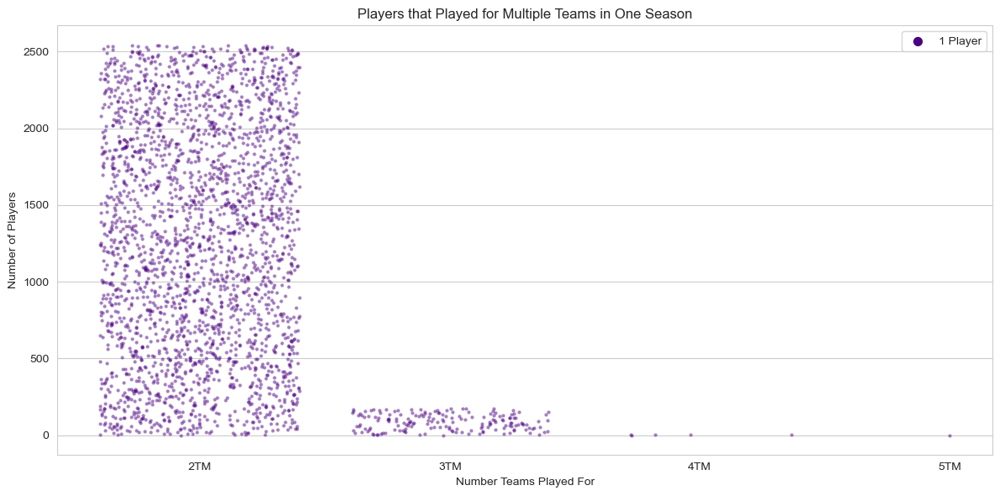

In [538]:
teams_2_to_5 = team_stats.loc[team_stats['Team'].isin(['2TM', '3TM', '4TM', '5TM'])].sort_values(by='Team', ascending=True)

plt.figure(figsize=(12, 6))

# Plot for two to five teams played on in one season
sns.stripplot(
    data=teams_2_to_5,
    x='Team',
    y='Index for Team',
    color='indigo',
    jitter=0.4,
    size=3,
    alpha=0.5
)

# Set title, labels, and legend
plt.title('Players that Played for Multiple Teams in One Season')
plt.xlabel('Number Teams Played For')
plt.ylabel('Number of Players')
plt.scatter([], [], label='1 Player', s=50, color='indigo')  # "Dummy" scatter plot for lhe legend
plt.legend()

# Display the plot
plt.tight_layout()
plt.show()

Look at the difference in player counts! Bobby Jones's 2008 season truly was an anomaly. Note that this only depicts players who've played for multiple teams—to get a better idea of the scale, let's zoom our perspective out and include in all players.

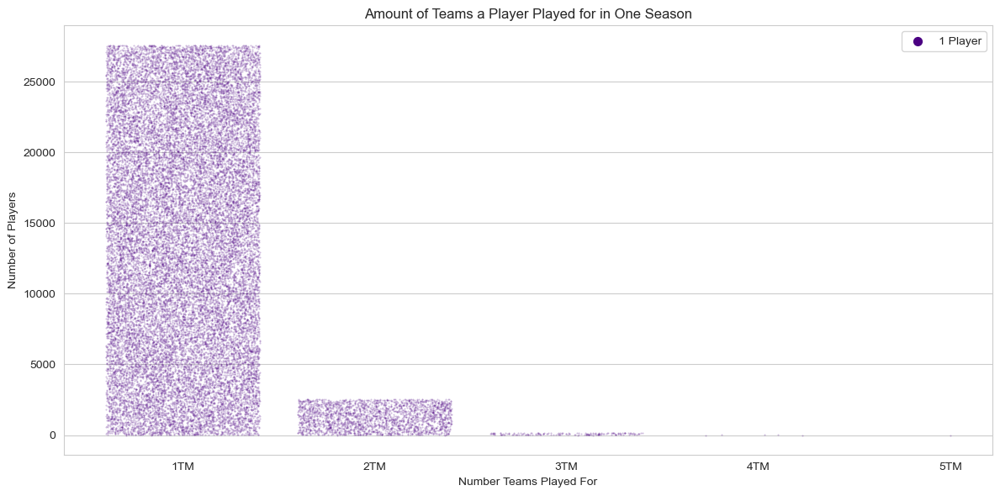

In [539]:
teams_1_to_5 = team_stats.sort_values(by='Team', ascending=True)

plt.figure(figsize=(12, 6))

# Plot for one to five teams played on in one season
sns.stripplot(
    data=teams_1_to_5,
    x='Team',
    y='Index for Team',
    color='indigo',
    jitter=0.4,
    size=1.5,
    alpha=0.25
)

# Set title, labels, and legend
plt.title('Amount of Teams a Player Played for in One Season')
plt.xlabel('Number Teams Played For')
plt.ylabel('Number of Players')
plt.scatter([], [], label='1 Player', s=50, color='indigo')  # "Dummy" scatter plot for lhe legend
plt.legend()

# Display the plot
plt.tight_layout()
plt.show()

Looking back at the first plot after seeing these two distributions really emphasizes just how little times an NBA player has played for more than two teams in one season, let alone four or five teams. Bobby Jones's 2008 season is hardly visible in this plot.

Now let's do some transformations.

In [540]:
nba_combined = data.drop_duplicates(subset=['Player', 'Year'], keep='first').reset_index(drop=True)
nba_combined.shape

(24653, 32)

In [541]:
median_pts_per_year = nba_combined.groupby('Year')['PTS'].median().reset_index()
median_pts_per_year.head()

,Year,PTS
0,1947,4.6
1,1948,5.5
2,1949,6.1
3,1950,6.1
4,1951,7.1


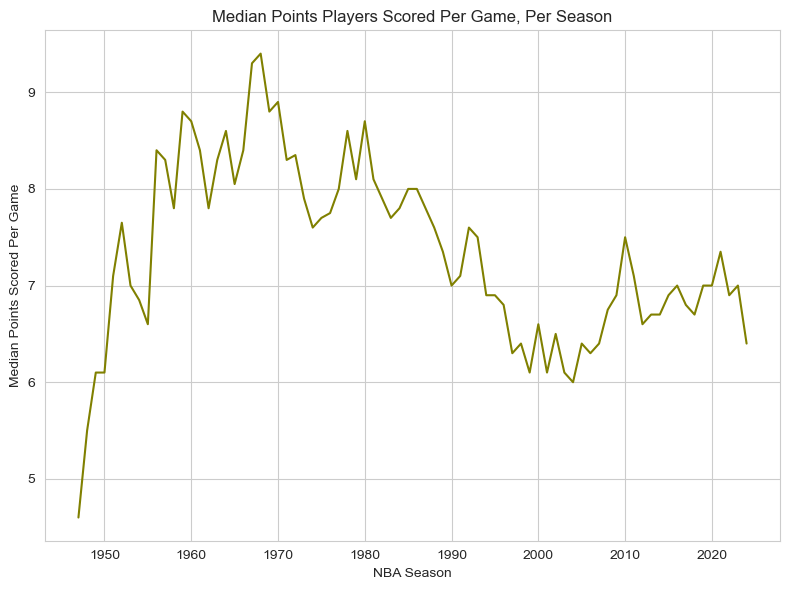

In [542]:
plt.figure(figsize=(8, 6))

sns.lineplot(
    data=median_pts_per_year,
    x='Year',
    y='PTS',
    color='olive'

)

plt.title('Median Points Players Scored Per Game, Per Season')
plt.xlabel('NBA Season')
plt.ylabel('Median Points Scored Per Game')

plt.tight_layout()
plt.show()

Interesting, it appears the median scoring peaked at around 1970, I'm interested to try to figure out why. After a significant drop, the median scoring seems to be be trending upwards.

In [543]:
nba_numeric_cols = nba_combined.dtypes[(nba_combined.dtypes == "float64") | (nba_combined.dtypes == "int64")]
nba_numeric = nba_combined[np.array(nba_numeric_cols.index)]
nba_corr = nba_numeric.corr()

nba_corr

,MP,FG,FGA,FG%,3P,3PA,3P%,2P,2PA,2P%,...,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS
MP,1.000000,0.889495,0.894965,0.282077,0.435544,0.441233,0.123171,0.828405,0.833724,0.236819,...,0.279196,0.515074,0.724401,0.685915,0.675527,0.745542,0.391815,0.817761,0.717761,0.891219
FG,0.889495,1.000000,0.976320,0.339025,0.404674,0.408203,0.111165,0.956399,0.945585,0.277707,...,0.290741,0.479596,0.669021,0.638170,0.616315,0.667693,0.361856,0.830730,0.600274,0.989655
FGA,0.894965,0.976320,1.000000,0.197166,0.483227,0.498191,0.144986,0.911728,0.927509,0.176217,...,0.307694,0.405963,0.622272,0.597450,0.635923,0.687410,0.298263,0.834317,0.594379,0.975491
FG%,0.282077,0.339025,0.197166,1.000000,-0.073339,-0.119850,0.011726,0.376537,0.283040,0.869762,...,0.032747,0.392520,0.351661,0.330265,0.113306,0.153946,0.316272,0.218079,0.283829,0.308484
3P,0.435544,0.404674,0.483227,-0.073339,1.000000,0.984937,0.500211,0.120537,0.127399,0.056360,...,0.327192,-0.224332,0.140224,0.024137,0.395773,0.334401,-0.118424,0.275178,0.058163,0.471841
3PA,0.441233,0.408203,0.498191,-0.119850,0.984937,1.000000,0.461572,0.128813,0.138109,0.052002,...,0.328058,-0.232882,0.139417,0.020678,0.417459,0.353456,-0.126953,0.293415,0.052776,0.475493
3P%,0.123171,0.111165,0.144986,0.011726,0.500211,0.461572,1.000000,-0.043587,-0.037534,-0.018206,...,0.228940,-0.272307,-0.066808,-0.139701,0.169953,0.108391,-0.187110,0.029053,-0.109374,0.145766
2P,0.828405,0.956399,0.911728,0.376537,0.120537,0.128813,-0.043587,1.000000,0.985941,0.283167,...,0.200932,0.587987,0.693978,0.693841,0.541409,0.615158,0.431749,0.813758,0.635074,0.924008
2PA,0.833724,0.945585,0.927509,0.283040,0.127399,0.138109,-0.037534,0.985941,1.000000,0.178579,...,0.216773,0.553512,0.660464,0.658292,0.559385,0.630913,0.393119,0.826923,0.628173,0.916731
2P%,0.236819,0.277707,0.176217,0.869762,0.056360,0.052002,-0.018206,0.283167,0.178579,1.000000,...,0.014024,0.266515,0.289362,0.296596,0.083718,0.133296,0.236274,0.154549,0.249097,0.255709


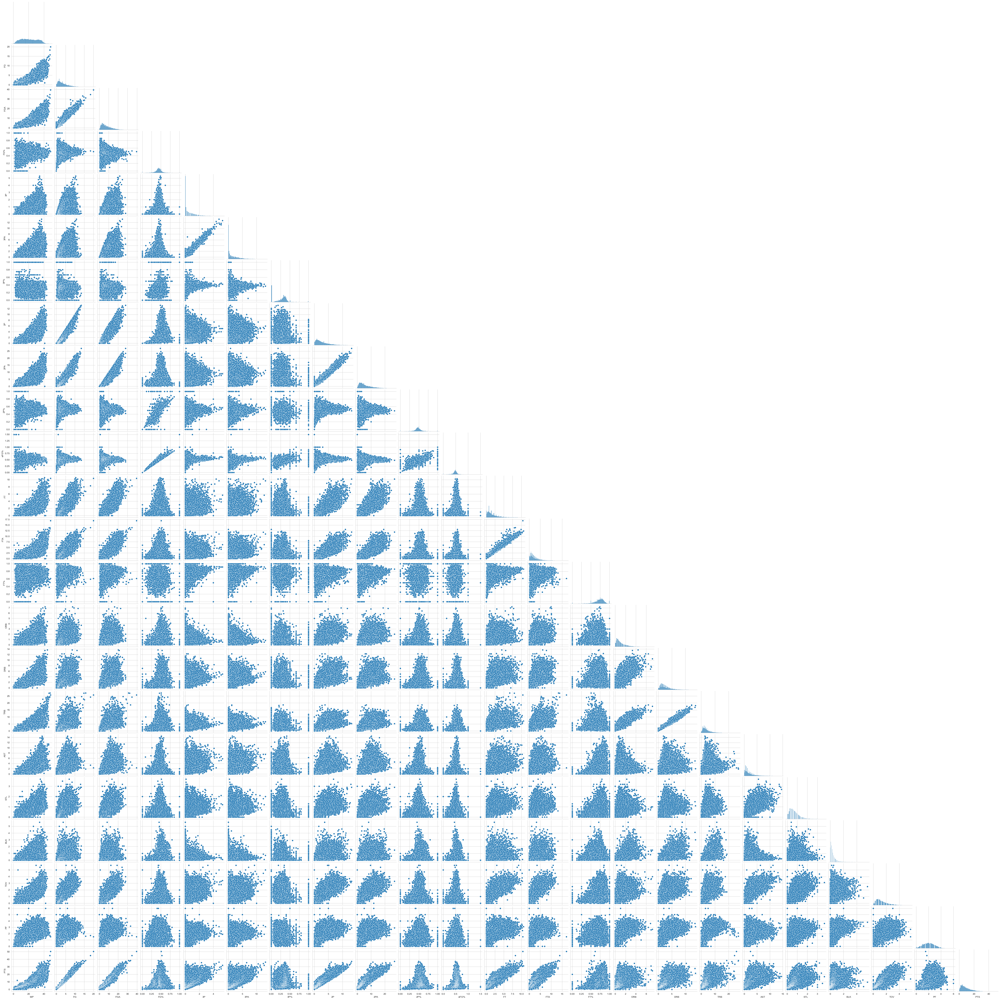

In [544]:
sns.pairplot(nba_numeric, corner = True);

Due to the enormous amount of variables we've just plotted, this is essentially unreadable, but it is impressive. We'll gain more insight looking at the correlation values found in `nba_corr`.

<Axes: xlabel='PTS', ylabel='Count'>

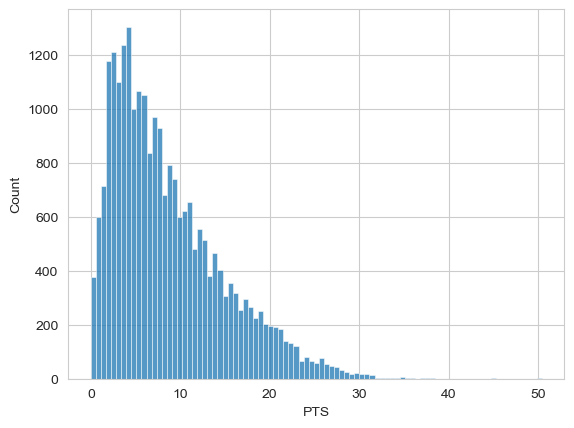

In [545]:
sns.histplot(nba_numeric["PTS"])

It looks like something between a Gamma distribution and an exponential distribution. I would've expected more of a normal distribution.
From visual inspection, it appears the median points scored per game is somewhere around 7.
Something else to note is that not many players have averaged over 30 points per game in a season—depicted by a diminishing right tail.

In [2]:
%%sql
SELECT *
FROM per_game_stats_raw

,Rk,Player,Age,Team,Pos,G,GS,MP,FG,FGA,...,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,Awards,Year
0,1.0,George Mikan,25.0,MNL,C,68.0,NaN,NaN,9.5,23.5,...,NaN,NaN,2.9,NaN,NaN,NaN,4.4,27.4,NBA1,1950
1,2.0,Alex Groza,23.0,INO,NaN,64.0,NaN,NaN,8.1,17.0,...,NaN,NaN,2.5,NaN,NaN,NaN,3.5,23.4,"ROY-1,NBA1",1950
2,3.0,Frankie Brian,26.0,AND,NaN,64.0,NaN,NaN,5.8,18.1,...,NaN,NaN,3.0,NaN,NaN,NaN,3.0,17.8,NBA2,1950
3,4.0,Kenny Sailors,29.0,DNN,NaN,57.0,NaN,NaN,5.8,16.6,...,NaN,NaN,4.0,NaN,NaN,NaN,4.2,17.3,NaN,1950
4,5.0,Dolph Schayes,21.0,SYR,NaN,64.0,NaN,NaN,5.4,14.1,...,NaN,NaN,4.0,NaN,NaN,NaN,3.5,16.8,NBA2,1950
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30306,167.0,Dick Shrider,25.0,NYK,NaN,4.0,NaN,NaN,0.0,0.0,...,NaN,NaN,0.5,NaN,NaN,NaN,0.5,0.3,NaN,1949
30307,168.0,Jack Maddox,29.0,INJ,NaN,1.0,NaN,NaN,0.0,0.0,...,NaN,NaN,1.0,NaN,NaN,NaN,0.0,0.0,NaN,1949
30308,169.0,Paul Napolitano,25.0,INJ,NaN,1.0,NaN,NaN,0.0,0.0,...,NaN,NaN,0.0,NaN,NaN,NaN,0.0,0.0,NaN,1949
30309,170.0,Ben Scharnus,31.0,PRO,NaN,1.0,NaN,NaN,0.0,1.0,...,NaN,NaN,0.0,NaN,NaN,NaN,0.0,0.0,NaN,1949


In [3]:
print(data.shape)

(30311, 32)


We only want each player’s combined statistics (where applicable), so we need to parse the `Player` and `Year` values to determine uniqueness.

In [8]:
nba = data.drop_duplicates(subset=['Player', 'Year'], keep='first').reset_index(drop=True)
nba = nba.dropna()
nba['Age'] = nba['Age'].astype(int)

print(nba.shape)
nba.head()

(2122, 32)


,Rk,Player,Age,Team,Pos,G,GS,MP,FG,FGA,...,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,Awards,Year
4799,4,Julius Erving,29,PHI,SF,78,78,36.1,10.7,20.7,...,4.6,7.4,4.6,2.2,1.8,3.6,2.7,26.9,"MVP-2,AS,NBA1",1980
4812,17,Larry Bird,23,BOS,PF,82,82,36.0,8.5,17.8,...,7.8,10.4,4.5,1.7,0.6,3.2,3.4,21.3,"MVP-4,ROY-1,AS,NBA1",1980
4862,67,Dave Cowens,31,BOS,C,66,55,32.7,6.4,14.1,...,6.2,8.1,3.1,1.0,0.9,1.6,3.3,14.2,AS,1980
4866,71,Tiny Archibald,31,BOS,PG,80,80,35.8,4.8,9.9,...,1.7,2.5,8.4,1.3,0.1,3.0,2.7,14.1,"MVP-5,AS",1980
5089,7,Julius Erving,30,PHI,SF,82,82,35.0,9.7,18.6,...,5.0,8.0,4.4,2.1,1.8,3.2,2.8,24.6,"MVP-1,AS,NBA1",1981
